In [1]:
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
%config InlineBackend.figure_format = "retina"
import seaborn as sns
import geopandas as gpd
from wordcloud import WordCloud
sns.set(font='sans-serif', context='notebook', palette='viridis')
plt.rcParams["figure.dpi"] = 300  

In [2]:
#link de la carpeta con los archivos
#https://drive.google.com/drive/folders/1URNS03zH2bk8IQC2pR5dc6NPOsfqXYJo?usp=sharing

In [3]:
data='C:/Users/thoma/Desktop/UDD/TVI/Proyecto/911a.csv' #Ubicación del archivo csv en el computador
df=pd.read_csv(data, delimiter=';')

In [4]:
df.head()

,recordId,callKey,callDateTime,priority,district,description,callNumber,incidentLocation,location,Neighborhood,PoliceDistrict,PolicePost,CouncilDistrict,SheriffDistricts,Community_Statistical_Areas,ZIPCode
0,1,10CC9DA95FF34377,2021/01/04 16:33:00+00,Low,TRU,HIT AND RUN,P210041843,3500 AILSA AV,3500 AILSA AV BALTIMORE MD,Waltherson,Northeastern,426,2,D4,Lauraville,21214
1,2,10CC9DA95FF3518A,2021/01/04 17:34:00+00,Medium,WD,NARCOTICS,P210042073,1700 N CALHOUN ST,1700 N CALHOUN ST BALTIMORE MD,Sandtown-Winchester,Western,742,7,D9,Sandtown-Winchester/Harlem Park,21217
2,3,10CC9DA95FF35312,2021/01/04 17:40:00+00,Low,CD,OTHER,P210042088,2000 DRUID HILL AV,2000 DRUID HILL AV BALTIMORE MD,Druid Heights,Central,131,11,D8,Upton/Druid Heights,21217
3,4,10CC9DA95FF3543D,2021/01/04 17:45:00+00,Medium,SD,NARCOTICS,P210042103,600 S PAYSON ST,600 S PAYSON ST BALTIMORE MD,Carrollton Ridge,Southern,934,9,D8,Southwest Baltimore,21223
4,5,10CC9DA95FF4659A,2021/01/05 13:11:00+00,Low,TRU,DESTRUCT PROP,P210051288,3600 CHESTERFIELD AV,3600 CHESTERFIELD AV BALTIMORE MD,Belair-Edison,Northeastern,432,13,D6,Belair-Edison,21213


# Primera Visualización
La primera visualización tiene como objetivo obtener un gráfico de barras apiladas observando la cantidad de llamadas por distrito en la ciudad de baltimore, considerando el nivel de prioridad que tiene.

In [5]:
#Librerias con nombres en español
nombres_distritos = {
    'Western': 'Oeste',
    'Eastern': 'Este',
    'Northwestern': 'Noroeste',
    'Northern': 'Norte',
    'Southwestern': 'Suroeste',
    'Southern': 'Sur',
    'Southeastern': 'Sureste',
    'Central': 'Central',
    'Northeastern': 'Noreste'
}
etiquetas_prioridad = {
    'Low': 'Baja',
    'Medium': 'Media',
    'High': 'Alta',
    'Non-Emergency': 'No Emergencia',
    'Out of Service': 'Fuera de Servicio',
    'Emergency': 'Emergencia'
}

In [6]:
#Renombrar datos de ingles a español
df['PoliceDistrict'] = df['PoliceDistrict'].map(nombres_distritos)
df['priority'] = df['priority'].map(etiquetas_prioridad)

In [7]:
#Crea una tabla de distrito vs nivel de emergencia
grafico1 = pd.crosstab(df['PoliceDistrict'], df['priority'], margins=True, margins_name='Total') 

In [8]:
grafico1.head()

priority,Alta,Baja,Emergencia,Fuera de Servicio,Media,No Emergencia,Total
PoliceDistrict,,,,,,,
Central,13759,56327,23,64,48460,16347,134980
Este,11853,32994,13,10,31437,12464,88771
Noreste,16223,58907,16,26,52511,23805,151488
Noroeste,12832,36903,11,21,45057,18654,113478
Norte,10846,40762,12,26,40593,19059,111298


In [9]:
#Se eliminan filas y columnas de total
grafico1a=grafico1.drop('Total', axis=1) 
grafico1a=grafico1a.drop('Total', axis=0)

In [10]:
#Ordena las columnas
column_order = ['Baja', 'Media', 'Alta', 'No Emergencia', 'Fuera de Servicio', 'Emergencia']
grafico1a_reordered1 = grafico1a[column_order]
#Ordena segun prioridad baja
grafico1a_sorted1 = grafico1a_reordered1.sort_values(by='Baja')

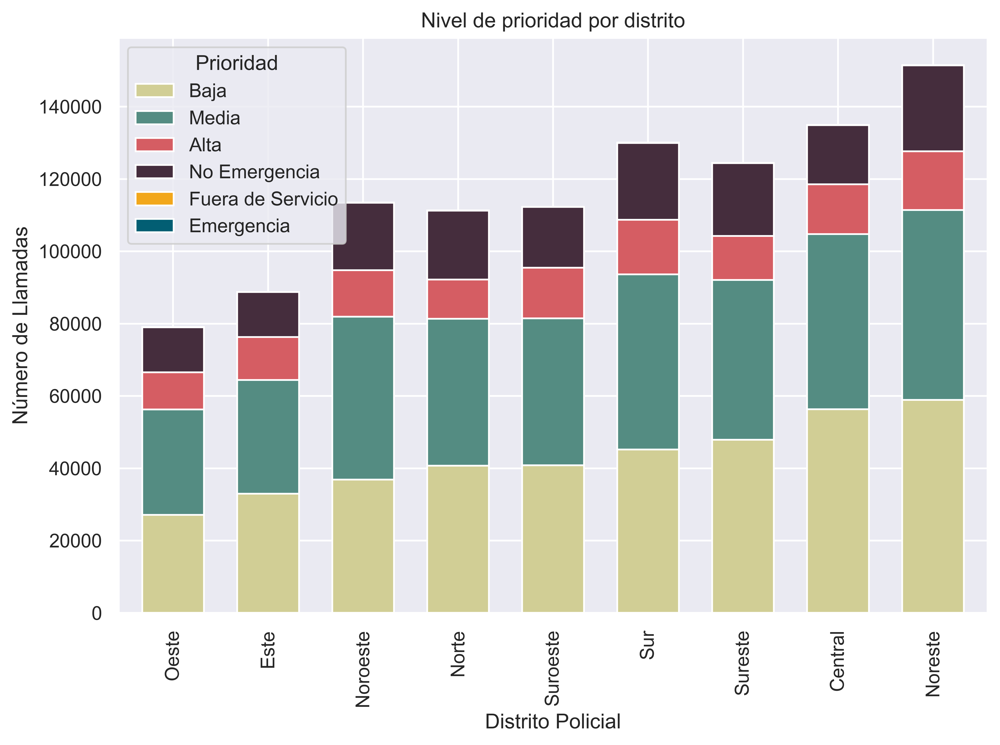

In [11]:
#Primera visualización
R1 = grafico1a_sorted1.plot(kind='bar', stacked=True, figsize=(9, 6),
                            color=['#d1ce95', '#548c82', '#d55d63', '#452d3d', '#F2A71B', '#025E73'],
                            width=0.65, title="Nivel de prioridad por distrito")

# Configurar etiquetas y títulos en español
R1.set_ylabel('Número de Llamadas')
R1.set_xlabel('Distrito Policial')
R1.set_title("Nivel de prioridad por distrito")

# Configurar leyenda
R1.legend(title='Prioridad')

# Mostrar el gráfico
plt.show()
#Guardar el gráfico
#R1.figure.savefig('C:/Users/thoma/Desktop/UDD/TVI/Proyecto/grafico1_hd.png', dpi=500, bbox_inches='tight')

En la visualización anterior se puede observar como existen más llamadas de prioridad baja y media, como tambien en que distritos se presencian más llamadas como es el caso de el distrito Noreste.

# Segunda Visualización

En la presente visualización se dan a conocer la cantidad de llamadas por mes para las distintas descripciones. Esto con el fin de ver las variaciones de estas en el tiempo e identificar posibles patrones.

C:\Users\thoma\AppData\Local\Temp\ipykernel_7636\1750986109.py:4: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df['mes'] = df['callDateTime'].dt.to_period('M')


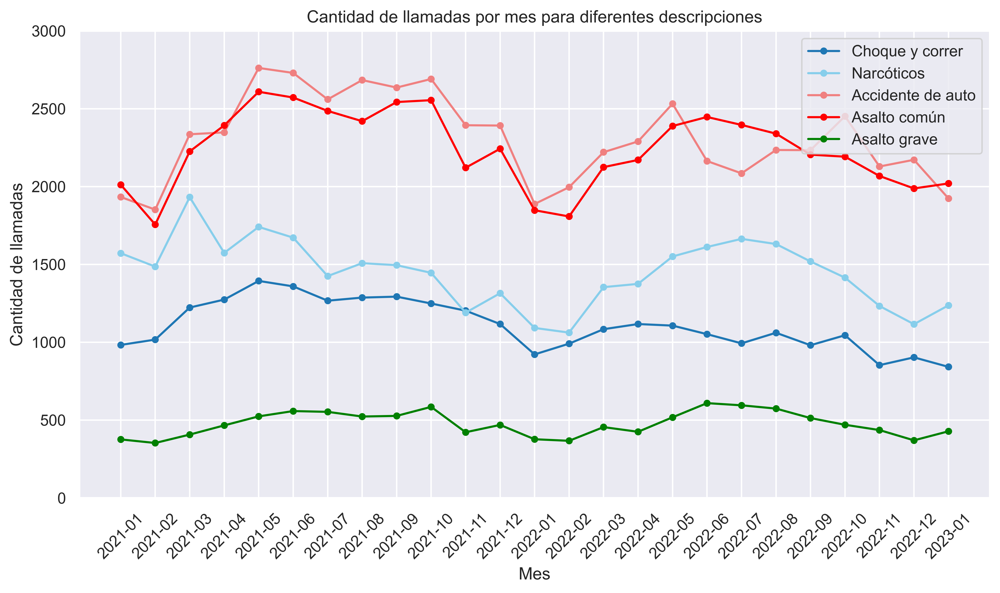

In [20]:
df['callDateTime'] = pd.to_datetime(df['callDateTime'])

# Crear una nueva columna que contiene solo el mes y el año
df['mes'] = df['callDateTime'].dt.to_period('M')

# Definir las descripciones determinadas
descripciones = ['HIT AND RUN', 'NARCOTICS', 'AUTO ACCIDENT', 'COMMON ASSAULT', 'AGGRAV ASSAULT']
# Traducción de las descripciones
traduccion = {
    'HIT AND RUN': 'Choque y correr',
    'NARCOTICS': 'Narcóticos',
    'AUTO ACCIDENT': 'Accidente de auto',
    'COMMON ASSAULT': 'Asalto común',
    'AGGRAV ASSAULT': 'Asalto grave'
}

plt.figure(figsize=(10, 6))

# Especificar los colores
colores = ['#1f77b4', 'skyblue', 'lightcoral', 'red', 'green']

# Crear una línea para cada descripción con su respectivo color
for descripcion, color in zip(descripciones, colores):
    df_por_mes = df[df['description'] == descripcion].groupby('mes').size()
    df_por_mes = df_por_mes.iloc[:-1]  
    plt.plot(df_por_mes.index.astype(str), df_por_mes.values, marker='o', linestyle='-', markersize=4, label=traduccion[descripcion], color=color)

# Personalizar el gráfico
plt.title('Cantidad de llamadas por mes para diferentes descripciones')
plt.xlabel('Mes')
plt.ylabel('Cantidad de llamadas')
plt.xticks(rotation=45)
plt.grid(True)
plt.ylim(0, 3000)
plt.legend()
plt.tight_layout()
#plt.savefig("C:/Users/thoma/Desktop/UDD/TVI/Proyecto/grafico2_hd.png", dpi=1000)
plt.show()

Se logra identificar que tanto a inicios de los años 2021, 2022 y 2023, en temporada de invierno en Baltimore (Enero-Febrero), el volumen de llamadas por las descripciones elegidas están en los menores valores del período de la visualización. Sumado a esto, se puede ver que en el verano los llamados aumentaron, se puede asumir que es por el tema de vacaciones y hay mas gente en las calles.

# Tercera Visualización
En esta visualización se busca ver el comportamiento por distrito de alguacil por periodo, para ver si entre ellos existe una tendencia similar o no, a fín de poder tener una distribución de recursos óptima dependiendo el comportamiento de cada uno.

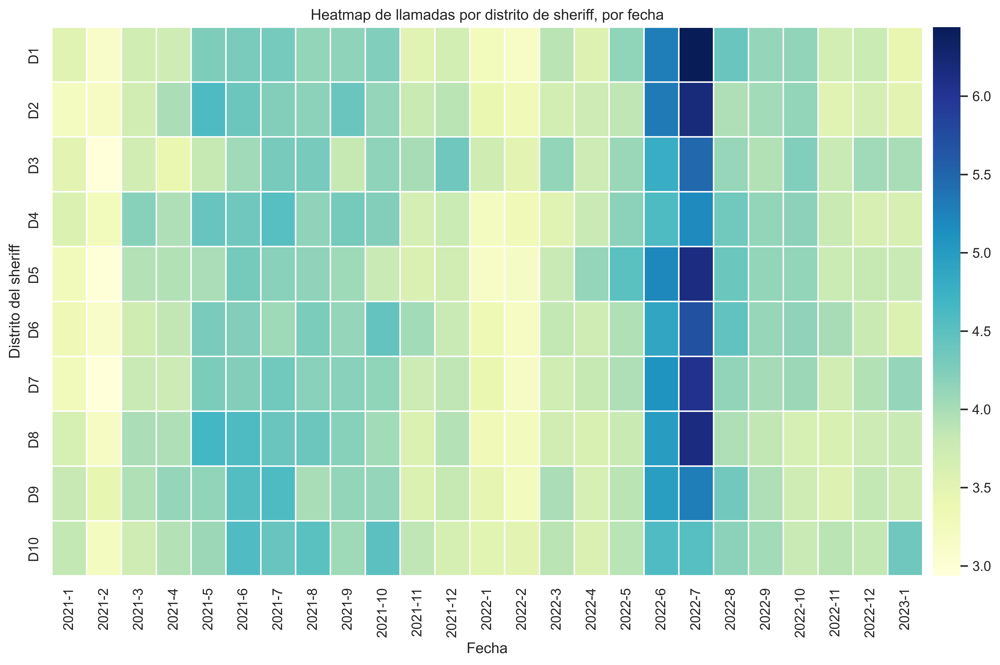

In [13]:
df['callDateTime'] = pd.to_datetime(df['callDateTime'])

# Filtrar los datos para excluir el último mes (febrero de 2023), por los pocos datos, lo que afecta toda la visualización
df_filtered = df[~((df['callDateTime'].dt.year == 2023) & (df['callDateTime'].dt.month == 2))].copy()

# Extraer año y mes de la fecha
df_filtered['año'] = df_filtered['callDateTime'].dt.year.astype(str)
df_filtered['mes'] = df_filtered['callDateTime'].dt.month.astype(str)

# Crear un heatmap pivotando los datos y calculando el total de llamadas
heatmap_data = df_filtered.pivot_table(index='SheriffDistricts', columns=['año', 'mes'], aggfunc='size', fill_value=0)

# Reindexar para asegurar que todos los años y meses estén representados
años = [str(año) for año in range(int(df_filtered['año'].min()), int(df_filtered['año'].max()) + 1)]
meses = [str(mes) for mes in range(1, 13)]

heatmap_data = heatmap_data.reindex(años, axis=1, level=0, fill_value=0)
heatmap_data = heatmap_data.reindex(meses, axis=1, level=1, fill_value=0)

# Normalizar los valores por fila para obtener los porcentajes
heatmap_data = heatmap_data.div(heatmap_data.sum(axis=1), axis=0) * 100

# Ordenar los distritos del sheriff de D1 a D10
distritos_ordenados = ['D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10']
heatmap_data = heatmap_data.reindex(distritos_ordenados)

# Visualizar el heatmap
plt.figure(figsize=(15, 8))
sns.heatmap(heatmap_data, fmt=".2f", cmap="YlGnBu",linewidth=1,cbar_kws=dict(shrink=1, pad=0.01))
plt.title("Heatmap de llamadas por distrito de sheriff, por fecha")
plt.xlabel("Fecha")
plt.ylabel('Distrito del sheriff')
#plt.savefig("C:/Users/thoma/Desktop/UDD/TVI/Proyecto/grafico3_hd.png", dpi=1000)
plt.show()

Se aprecia un comportamiento similar entre los distintos distritos de Sheriff a lo largo del tiempo, siendo los periodos de menor demanda coincidentes con las vacaciones de invierno en U.S.A (Enero-Febrero) y con mayor cantidad de llamada en Junio-Julio de 2022, vacaciones de verano, diferente a los mismos meses del año anterior, probablemente se deba a que todavía estaban con restricción de salir por la pandemia.

# Tabla de total de llamadas por distrito de Sheriff

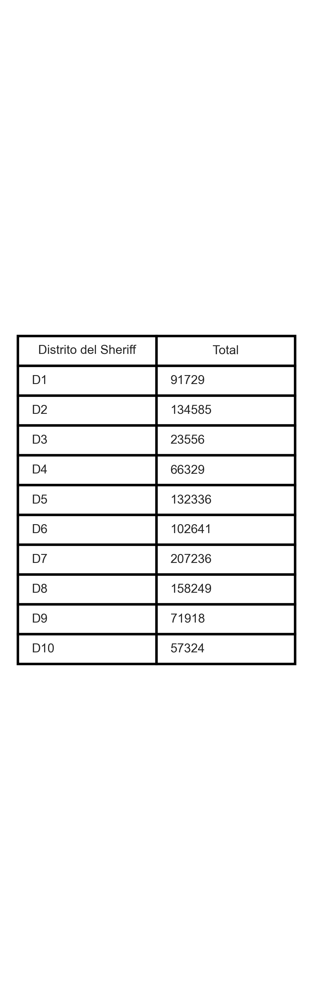

In [14]:
pd.set_option('display.max_rows', None)

# Obtener el conteo de valores de los distritos del sheriff
SheriffDistricts_counts = df['SheriffDistricts'].value_counts()

# Resetear el índice y renombrar las columnas
SheriffDistricts_counts_df = SheriffDistricts_counts.reset_index()
SheriffDistricts_counts_df.columns = ['Distrito del Sheriff', 'Total']  # Cambiar el nombre de la columna 

# Ordenar por distrito del D1 al D10
SheriffDistricts_counts_df['Distrito del Sheriff'] = SheriffDistricts_counts_df['Distrito del Sheriff'].str.replace('D', '').astype(int)
SheriffDistricts_counts_df = SheriffDistricts_counts_df.sort_values(by='Distrito del Sheriff').reset_index(drop=True)
SheriffDistricts_counts_df['Distrito del Sheriff'] = 'D' + SheriffDistricts_counts_df['Distrito del Sheriff'].astype(str)

# Tabla
plt.figure(figsize=(2, 7))
plt.table(cellText=SheriffDistricts_counts_df.values, colLabels=SheriffDistricts_counts_df.columns, loc='center' ,cellLoc='left')
plt.axis('off')  
#plt.savefig('C:/Users/thoma/Desktop/UDD/TVI/Proyecto/tabla_distritos.png', dpi=1000, bbox_inches='tight')
plt.show()

# Cuarta Visualización

En esta visualización se realiza un heatmap con el fin de analizar el comportamiento de los distintos barrios en el dataset, a través de esto es posible identificar zonas específicas de alto impacto independiente del distrito en la que se presente.

In [15]:
#Archivo geojson
zones = gpd.read_file("C:/Users/thoma/Desktop/UDD/TVI/baltimore.geojson")

In [16]:
# Agrupar las llamadas por barrio
llamadas_por_barrio = df.groupby('Neighborhood').size().reset_index(name='num_llamadas')

# Unir la información de llamadas con el DataFrame geojson
zones = zones.rename(columns={'name': 'Neighborhood'})
zones = zones.merge(llamadas_por_barrio, on='Neighborhood', how='left')
zones['num_llamadas'] = zones['num_llamadas'].fillna(0)  

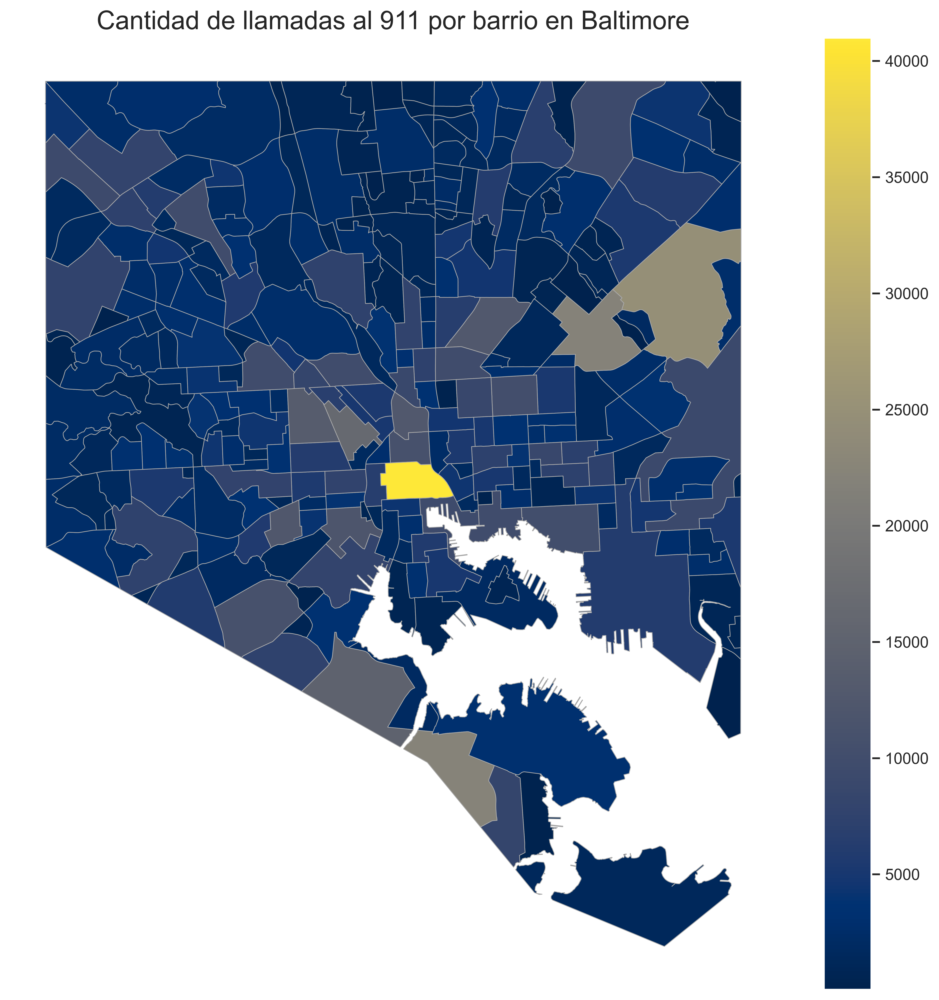

In [17]:
# Crear una paleta de colores para el heatmap
cmap = 'cividis'

# Dibujar el gráfico de cloropletas
fig, ax = plt.subplots(1, 1, figsize=(12, 12), dpi=300)  
zones.plot(column='num_llamadas', ax=ax, legend=True, cmap=cmap, edgecolor='darkgrey', linewidth=0.5)

# Ajustes adicionales
ax.set_title("Cantidad de llamadas al 911 por barrio en Baltimore", fontsize=18)
ax.set_axis_off()  
#plt.savefig("C:/Users/thoma/Desktop/UDD/TVI/Proyecto/grafico4_hd.png", dpi=1000)
plt.show()

Se puede notar una concentración mayoritaria de llamadas en la zona central, a esta le sigue la zona sur y noreste de Baltimore. En el resto de los distritos y barrios se ve más homogéneo 

# Tabla del Número de llamadas de los mejores 10 barrios

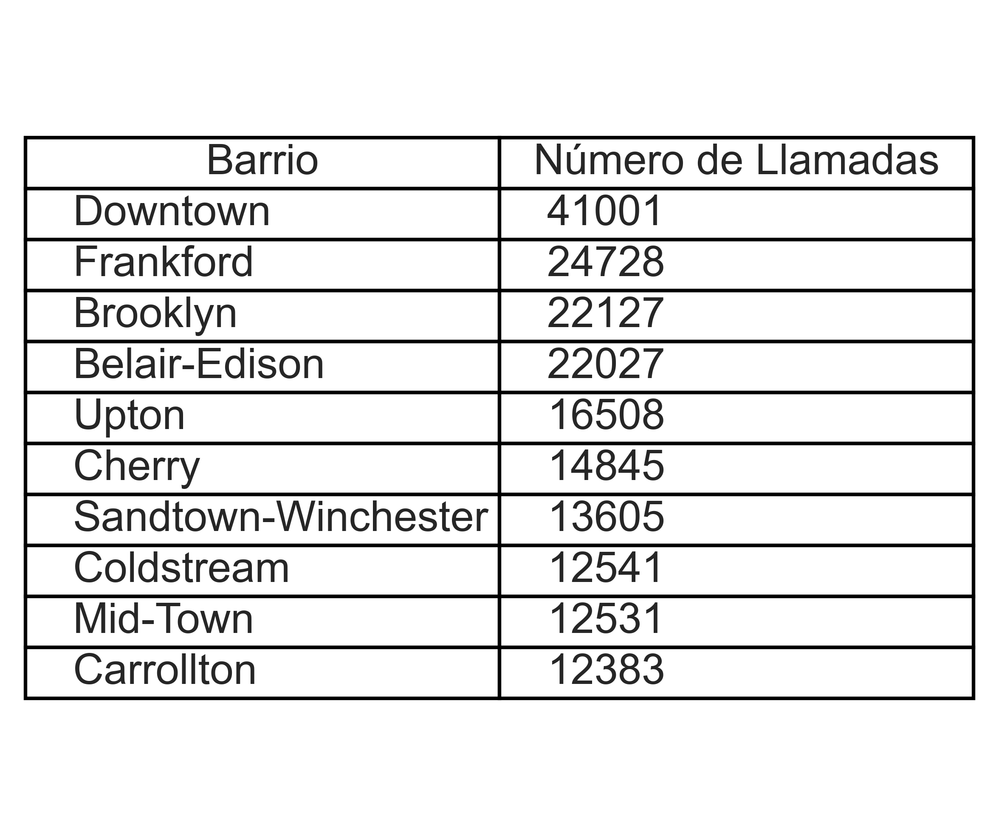

In [18]:
top_10_barrios = zones[['Neighborhood', 'num_llamadas']].nlargest(10, 'num_llamadas')

top_10_barrios['Neighborhood'] = top_10_barrios['Neighborhood'].str.split().str[0]
# Resetear el índice y renombrar las columnas
top_10_barrios = top_10_barrios.reset_index(drop=True)
top_10_barrios.columns = ['Barrio', 'Número de Llamadas']


# Mostrar como tabla
plt.figure(figsize=(4, 4))
table = plt.table(cellText=top_10_barrios.values, colLabels=top_10_barrios.columns, loc='center', cellLoc='left')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)  
plt.axis('off')  
#plt.savefig('C:/Users/thoma/Desktop/UDD/TVI/Proyecto/top_10_barrios_llamadas.png', dpi=300, bbox_inches='tight')
plt.show()

# Quinta Visualización

Esta visualización corresponde a la cantidad de llamadas según el barrio en que se hizo, mientras más grande se vea el nombre del barrio, más llamadas tiene.

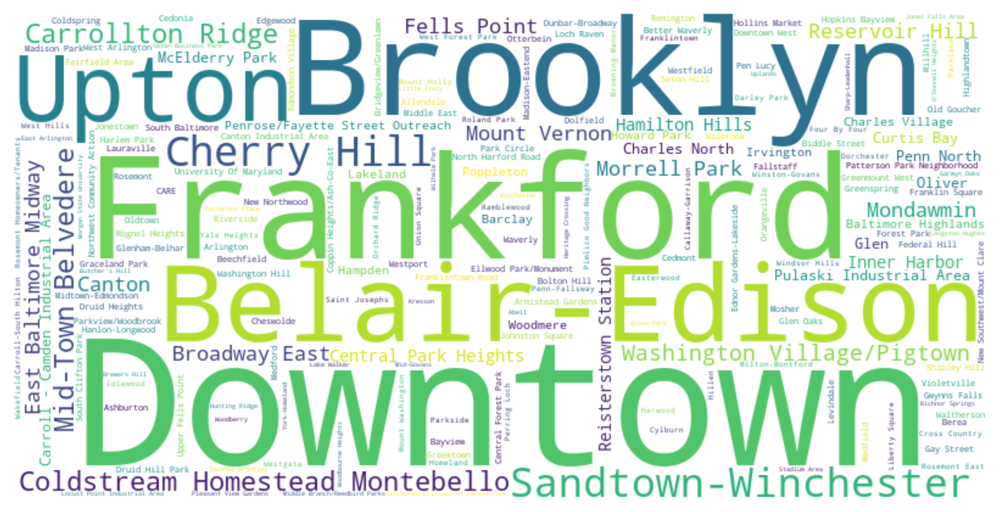

In [19]:
#Transforma el dataset llamdas_por_barrio en un diccionario
llamadas_por_barrio2 = llamadas_por_barrio.set_index('Neighborhood')['num_llamadas'].to_dict()

#Creación de la visualización
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(llamadas_por_barrio2)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
#plt.savefig("C:/Users/thoma/Desktop/UDD/TVI/Proyecto/grafico5_hd.png", dpi=1000)
plt.show()

En esta visualización se puede observar como el barrio en que hubo más llamadas fue Downtown, seguido de Franford, Brooklyn y Belair-Edison, luego hay otros pocos barrios que le siguen en número, pero en general se nota bastante diferencia entre la cantidad de llamadas, existe una gran cantidad de barrios que tuvieron pocas llamadas en comparación de los que más tuvieron.